<a href="https://colab.research.google.com/github/MalihaRaida/Object-Detection-Experiments/blob/main/YOLOv8_adding_a_head.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!git clone https://github.com/ultralytics/ultralytics

Cloning into 'ultralytics'...
remote: Enumerating objects: 69884, done.
remote: Counting objects: 100% (1464/1464), done.
remote: Compressing objects: 100% (675/675), done.
remote: Total 69884 (delta 1256), reused 794 (delta 789), pack-reused 68420 (from 4)
Receiving objects: 100% (69884/69884), 37.27 MiB | 12.30 MiB/s, done.
Resolving deltas: 100% (52131/52131), done.


In [ ]:
%cd /content/ultralytics

/content/ultralytics


In [ ]:
!git reset --hard 6806f15396432fffb951250d650454b840eb4c28

HEAD is now at 6806f1539 Fix `model.end2end` assert (#17391)


In [ ]:
# Download patch
!wget https://gist.githubusercontent.com/Y-T-G/8f4fc0b78a0a559a06fe84ae4f359e6e/raw/f8e9ba1644cbfa86295f14fbe26c3d91a504b155/add_head.patch

--2025-10-02 17:23:03--  https://gist.githubusercontent.com/Y-T-G/8f4fc0b78a0a559a06fe84ae4f359e6e/raw/f8e9ba1644cbfa86295f14fbe26c3d91a504b155/add_head.patch
Resolving gist.githubusercontent.com (gist.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to gist.githubusercontent.com (gist.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 11324 (11K) [text/plain]
Saving to: ‘add_head.patch’

add_head.patch      100%[===================>]  11.06K  --.-KB/s    in 0.001s  

2025-10-02 17:23:03 (18.4 MB/s) - ‘add_head.patch’ saved [11324/11324]



In [ ]:
!git apply add_head.patch

In [ ]:
!pip install -e .

Obtaining file:///content/ultralytics
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Building editable for ultralytics (pyproject.toml) ... done
  Created wheel for ultralytics: filename=ultralytics-8.3.28-0.editable-py3-none-any.whl size=22722 sha256=4a0e895824a81a0a7047e8a6e1d9ea290175805aabbdb95a0eedf0254b1aaf59
  Stored in directory: /tmp/pip-ephem-wheel-cache-fe7a9reg/wheels/60/e0/59/e2f034f296abbdca5c21e3f5be76b9ca685f13c7bd17f8b58c
Successfully built ultralytics


# Download dataset

In [ ]:
!pip install roboflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.7/88.7 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 8.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 24.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 40.5 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.12.0.88
    Uninstalling opencv-python-headless-4.12.0.88:
      Successfully uninstalled opencv-python-headless-4.12.0.88
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10


In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="WlZr7BIH0ffcM4WwWlpa")
project = rf.workspace("project-n3wam").project("project-ttd5y")
version = project.version(1)
dataset = version.download("yolov8")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Project-1 in yolov8:: 100%|██████████| 2012/2012 [00:01<00:00, 1568.83it/s]


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
!mkdir -p /content/datasets/Project-1
!mv Project-1/** /content/datasets/Project-1


# Train a model with frozen COCO backbone

In [ ]:
# Reset runtime
import IPython
IPython.Application.instance().kernel.do_shutdown(True)

# Wait for restart and then continue

{'status': 'ok', 'restart': True}

> **WARNING**
>
> Wait for the Colab kernel to crash and restart after running the above cell, before continuing.

In [ ]:
%cd /content/ultralytics

/content/ultralytics


In [ ]:
from ultralytics import YOLO
import torch
import copy

In [ ]:
model = YOLO("yolov8n.pt")  # load a pretrained model (recommended for training)

100%|██████████| 6.25M/6.25M [00:00<00:00, 83.7MB/s]


In [ ]:
# Keep a copy of old state dict for sanity check
old_dict = copy.deepcopy(model.state_dict())

In [ ]:
# We should freeze all but the last layer
model.state_dict().keys()

odict_keys(['model.model.0.conv.weight', 'model.model.0.bn.weight', 'model.model.0.bn.bias', 'model.model.0.bn.running_mean', 'model.model.0.bn.running_var', 'model.model.0.bn.num_batches_tracked', 'model.model.1.conv.weight', 'model.model.1.bn.weight', 'model.model.1.bn.bias', 'model.model.1.bn.running_mean', 'model.model.1.bn.running_var', 'model.model.1.bn.num_batches_tracked', 'model.model.2.cv1.conv.weight', 'model.model.2.cv1.bn.weight', 'model.model.2.cv1.bn.bias', 'model.model.2.cv1.bn.running_mean', 'model.model.2.cv1.bn.running_var', 'model.model.2.cv1.bn.num_batches_tracked', 'model.model.2.cv2.conv.weight', 'model.model.2.cv2.bn.weight', 'model.model.2.cv2.bn.bias', 'model.model.2.cv2.bn.running_mean', 'model.model.2.cv2.bn.running_var', 'model.model.2.cv2.bn.num_batches_tracked', 'model.model.2.m.0.cv1.conv.weight', 'model.model.2.m.0.cv1.bn.weight', 'model.model.2.m.0.cv1.bn.bias', 'model.model.2.m.0.cv1.bn.running_mean', 'model.model.2.m.0.cv1.bn.running_var', 'model.mod

In [ ]:
# # Add a callback to put the frozen layers in eval mode to prevent BN values
# # from changing.
def put_in_eval_mode(trainer, n_layers=22):
  for i, (name, module) in enumerate(trainer.model.named_modules()):
    if name.endswith("bn") and int(name.split('.')[1]) < n_layers:
      module.eval()
      module.track_running_stats = False
      print(name, " put in eval mode.")

In [ ]:
model.add_callback("on_train_epoch_start", put_in_eval_mode)
model.add_callback("on_pretrain_routine_start", put_in_eval_mode)

In [ ]:
# Train the model. Freeze the first 22 layers [0-21].
results = model.train(data='/content/datasets/Project-1/data.yaml', freeze=22, epochs=20, imgsz=640)

New https://pypi.org/project/ultralytics/8.3.204 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.28 🚀 Python-3.12.11 torch-2.8.0+cu126 CPU (Intel Xeon 2.20GHz)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/datasets/Project-1/data.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=22, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_

100%|██████████| 755k/755k [00:00<00:00, 16.7MB/s]


Overriding model.yaml nc=80 with nc=2

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /content/datasets/Project-1/train/labels... 700 images, 0 backgrounds, 0 corrupt: 100%|██████████| 700/700 [00:00<00:00, 1015.39it/s]


train: New cache created: /content/datasets/Project-1/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


Argument(s) 'quality_lower' are not valid for transform ImageCompression
'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
val: Scanning /content/datasets/Project-1/valid/labels... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<00:00, 1725.96it/s]

val: New cache created: /content/datasets/Project-1/valid/labels.cache


Plotting labels to /content/ultralytics/runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to /content/ultralytics/runs/detect/train
Starting training for 20 epochs...
model.0.bn  put in eval mode.
model.1.bn  put in eval mode.
model.2.cv1.bn  put in eval mode.
model.2.cv2.bn  put in eval mode.
model.2.m.0.cv1.bn  put in eval mode.
model.2.m.0.cv2.bn  put in eval mode.
model.3.bn  put in eval mode.
model.4.cv1.bn  put in eval mode.
model.4.cv2.bn  put in eval mode.
model.4.m.0.cv1.bn  put in eval mode.
model.4.m.0.cv2.bn  put in eval mode.
model.4.m.1.cv1.bn  put in eval mode.
model.4.m.1.cv2.bn  put in eval 

  0%|          | 0/44 [00:01<?, ?it/s]


KeyboardInterrupt: 

In [ ]:
def compare_dicts(state_dict1, state_dict2):
    # Compare the keys
    keys1 = set(state_dict1.keys())
    keys2 = set(state_dict2.keys())

    if keys1 != keys2:
        print("Models have different parameter names.")
        return False

    # Compare the values (weights)
    for key in keys1:
        if not torch.equal(state_dict1[key], state_dict2[key]):
            print(f"Weights for parameter '{key}' are different.")
            if "bn" in key and "22" not in key:
              state_dict1[key] = state_dict2[key]

In [ ]:
# Compare the dicts. Changes should only be in layer 21 and above
compare_dicts(old_dict, model.state_dict())

Weights for parameter 'model.model.22.cv3.1.1.bn.running_var' are different.
Weights for parameter 'model.model.22.cv2.1.0.bn.weight' are different.
Weights for parameter 'model.model.22.cv2.0.0.bn.running_mean' are different.
Weights for parameter 'model.model.22.cv3.1.0.bn.bias' are different.
Weights for parameter 'model.model.22.cv3.0.0.bn.bias' are different.
Weights for parameter 'model.model.22.cv2.2.1.bn.bias' are different.
Weights for parameter 'model.model.22.cv2.0.0.bn.weight' are different.
Weights for parameter 'model.model.22.cv3.2.1.conv.weight' are different.
Weights for parameter 'model.model.22.cv3.0.0.bn.weight' are different.
Weights for parameter 'model.model.22.cv3.2.0.bn.bias' are different.
Weights for parameter 'model.model.22.cv2.2.0.conv.weight' are different.
Weights for parameter 'model.model.22.cv2.0.0.bn.bias' are different.
Weights for parameter 'model.model.22.cv2.0.2.weight' are different.
Weights for parameter 'model.model.22.cv2.1.1.bn.weight' are d

In [ ]:
new_state_dict = dict()

In [ ]:
#  Increment the head number by 1 in the state_dict
for k, v in model.state_dict().items():
  if k.startswith("model.model.22"):
    new_state_dict[k.replace("model.22", "model.23")] = v
  # else:
  #   new_state_dict[k] = v

In [ ]:
# Save the current state_dict
torch.save(new_state_dict, "yolov8n_lp.pth")

# Create new architecture with extra head and load custom weights

In [ ]:
from ultralytics import YOLO
import torch

In [ ]:
# Edit this to the number of new classes you added
added_classes = 2 # Added 2 new classes.
nc = 80 + added_classes # Total no. of classes

# Update yaml with the number of added_classes
!sed -i "52s/.*/  - \[\[15, 18, 21\], 1, Detect, \[{added_classes}\]\]/g" ultralytics/cfg/models/v8/yolov8n-2xhead.yaml
!sed -i "5s/.*/nc: {nc}/g" ultralytics/cfg/models/v8/yolov8n-2xhead.yaml

In [ ]:
model_2 = YOLO('ultralytics/cfg/models/v8/yolov8n-2xhead.yaml', task="detect").load('yolov8n.pt')

Transferred 355/440 items from pretrained weights


In [ ]:
model_2.state_dict().keys()

odict_keys(['model.model.0.conv.weight', 'model.model.0.bn.weight', 'model.model.0.bn.bias', 'model.model.0.bn.running_mean', 'model.model.0.bn.running_var', 'model.model.0.bn.num_batches_tracked', 'model.model.1.conv.weight', 'model.model.1.bn.weight', 'model.model.1.bn.bias', 'model.model.1.bn.running_mean', 'model.model.1.bn.running_var', 'model.model.1.bn.num_batches_tracked', 'model.model.2.cv1.conv.weight', 'model.model.2.cv1.bn.weight', 'model.model.2.cv1.bn.bias', 'model.model.2.cv1.bn.running_mean', 'model.model.2.cv1.bn.running_var', 'model.model.2.cv1.bn.num_batches_tracked', 'model.model.2.cv2.conv.weight', 'model.model.2.cv2.bn.weight', 'model.model.2.cv2.bn.bias', 'model.model.2.cv2.bn.running_mean', 'model.model.2.cv2.bn.running_var', 'model.model.2.cv2.bn.num_batches_tracked', 'model.model.2.m.0.cv1.conv.weight', 'model.model.2.m.0.cv1.bn.weight', 'model.model.2.m.0.cv1.bn.bias', 'model.model.2.m.0.cv1.bn.running_mean', 'model.model.2.m.0.cv1.bn.running_var', 'model.mod

In [ ]:
state_dict = torch.load("yolov8n_lp.pth")

In [ ]:
state_dict.keys()

dict_keys(['model.model.23.cv2.0.0.conv.weight', 'model.model.23.cv2.0.0.bn.weight', 'model.model.23.cv2.0.0.bn.bias', 'model.model.23.cv2.0.0.bn.running_mean', 'model.model.23.cv2.0.0.bn.running_var', 'model.model.23.cv2.0.0.bn.num_batches_tracked', 'model.model.23.cv2.0.1.conv.weight', 'model.model.23.cv2.0.1.bn.weight', 'model.model.23.cv2.0.1.bn.bias', 'model.model.23.cv2.0.1.bn.running_mean', 'model.model.23.cv2.0.1.bn.running_var', 'model.model.23.cv2.0.1.bn.num_batches_tracked', 'model.model.23.cv2.0.2.weight', 'model.model.23.cv2.0.2.bias', 'model.model.23.cv2.1.0.conv.weight', 'model.model.23.cv2.1.0.bn.weight', 'model.model.23.cv2.1.0.bn.bias', 'model.model.23.cv2.1.0.bn.running_mean', 'model.model.23.cv2.1.0.bn.running_var', 'model.model.23.cv2.1.0.bn.num_batches_tracked', 'model.model.23.cv2.1.1.conv.weight', 'model.model.23.cv2.1.1.bn.weight', 'model.model.23.cv2.1.1.bn.bias', 'model.model.23.cv2.1.1.bn.running_mean', 'model.model.23.cv2.1.1.bn.running_var', 'model.model.2

In [ ]:
# Load state_dict of the custom trained model head. Layer 23.
model_2.load_state_dict(state_dict, strict=False)

_IncompatibleKeys(missing_keys=['model.model.0.conv.weight', 'model.model.0.bn.weight', 'model.model.0.bn.bias', 'model.model.0.bn.running_mean', 'model.model.0.bn.running_var', 'model.model.1.conv.weight', 'model.model.1.bn.weight', 'model.model.1.bn.bias', 'model.model.1.bn.running_mean', 'model.model.1.bn.running_var', 'model.model.2.cv1.conv.weight', 'model.model.2.cv1.bn.weight', 'model.model.2.cv1.bn.bias', 'model.model.2.cv1.bn.running_mean', 'model.model.2.cv1.bn.running_var', 'model.model.2.cv2.conv.weight', 'model.model.2.cv2.bn.weight', 'model.model.2.cv2.bn.bias', 'model.model.2.cv2.bn.running_mean', 'model.model.2.cv2.bn.running_var', 'model.model.2.m.0.cv1.conv.weight', 'model.model.2.m.0.cv1.bn.weight', 'model.model.2.m.0.cv1.bn.bias', 'model.model.2.m.0.cv1.bn.running_mean', 'model.model.2.m.0.cv1.bn.running_var', 'model.model.2.m.0.cv2.conv.weight', 'model.model.2.m.0.cv2.bn.weight', 'model.model.2.m.0.cv2.bn.bias', 'model.model.2.m.0.cv2.bn.running_mean', 'model.model

In [ ]:
# Output of COCO model
model_coco = YOLO("yolov8n.pt")

# For consistency
model_coco.model.names = {k:k for k in model_coco.names.keys()}

result_coco = model_coco.predict("/content/IMG_2772.jpg")[0]


image 1/1 /content/IMG_2772.jpg: 480x640 6 2s, 133.5ms
Speed: 3.2ms preprocess, 133.5ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)


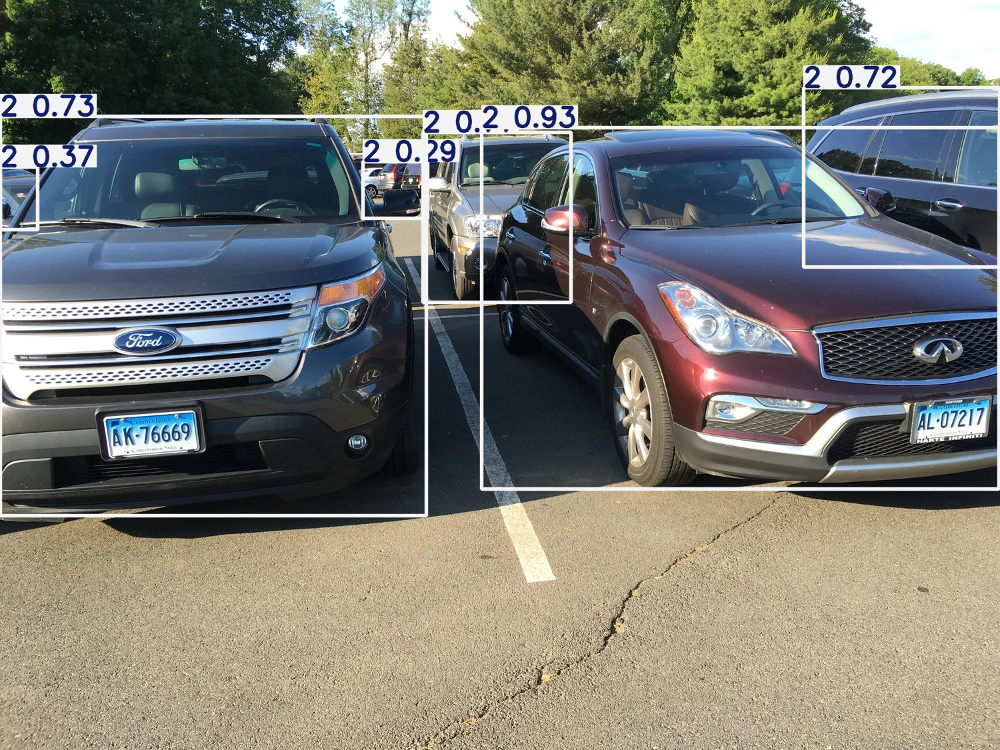

In [ ]:
result_coco.show()


image 1/1 /content/IMG_2772.jpg: 480x640 2 0s, 148.2ms
Speed: 2.9ms preprocess, 148.2ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)


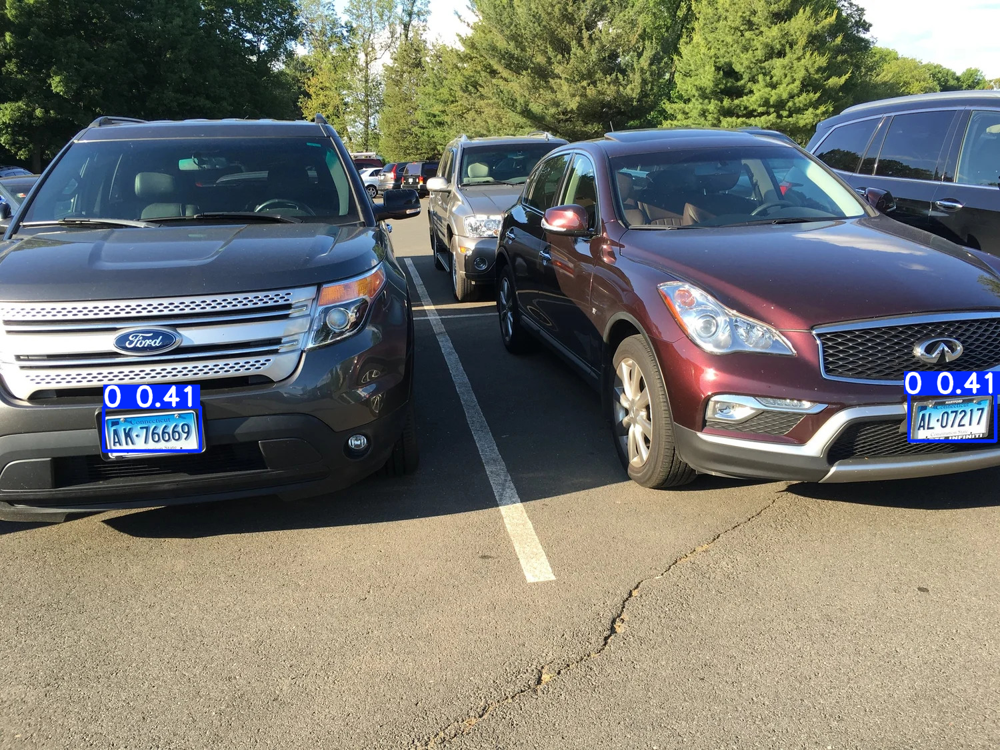

In [ ]:
# Output of custom LP model
model_lp = YOLO("/content/ultralytics/runs/detect/train2/weights/best.pt")

# For plotting consistency, change all class names to class numbers
model_lp.model.names = {k:k for k in model_lp.names.keys()}

result_lp = model_lp.predict("/content/IMG_2772.jpg")[0]

result_lp.show()

In [ ]:
# Output of the new model
result_merged = model_2.predict("/content/IMG_2772.jpg")[0]


image 1/1 /content/IMG_2772.jpg: 480x640 6 2s, 2 80s, 165.5ms
Speed: 2.8ms preprocess, 165.5ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)


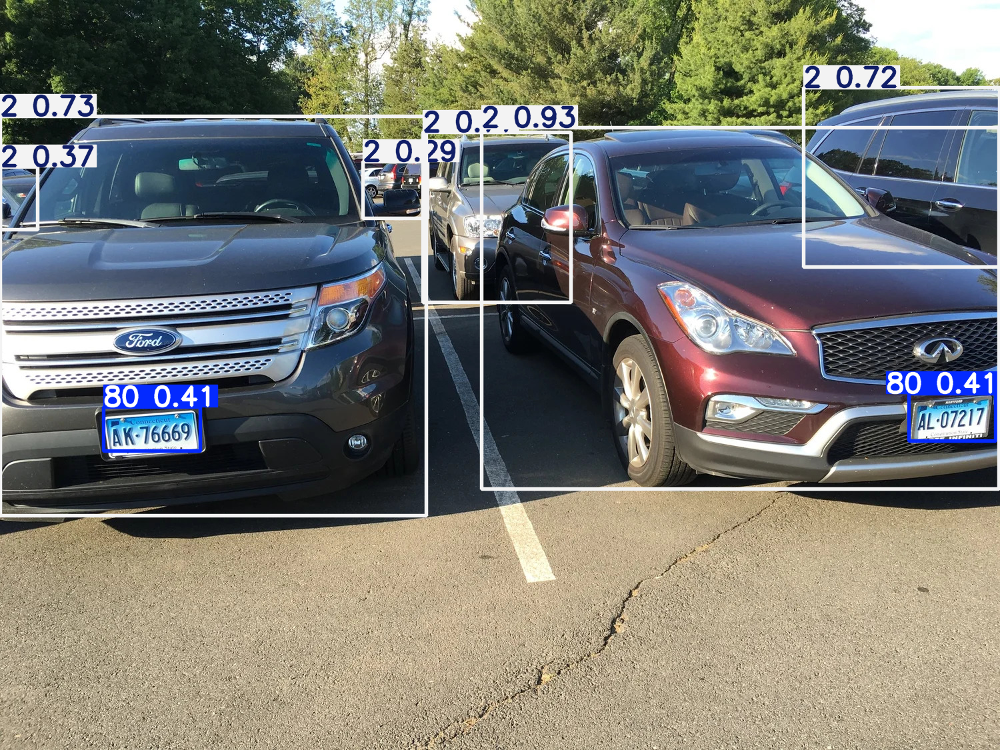

In [ ]:
result_merged.show()

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
def show_output(images):
    image = np.vstack(images)
    fig = plt.figure()
    ax = plt.Axes(fig, [0., 0., 1., 1.])
    ax.set_axis_off()
    fig.add_axes(ax)
    fig.set_size_inches((5,15))
    ax.imshow(image[...,::-1])

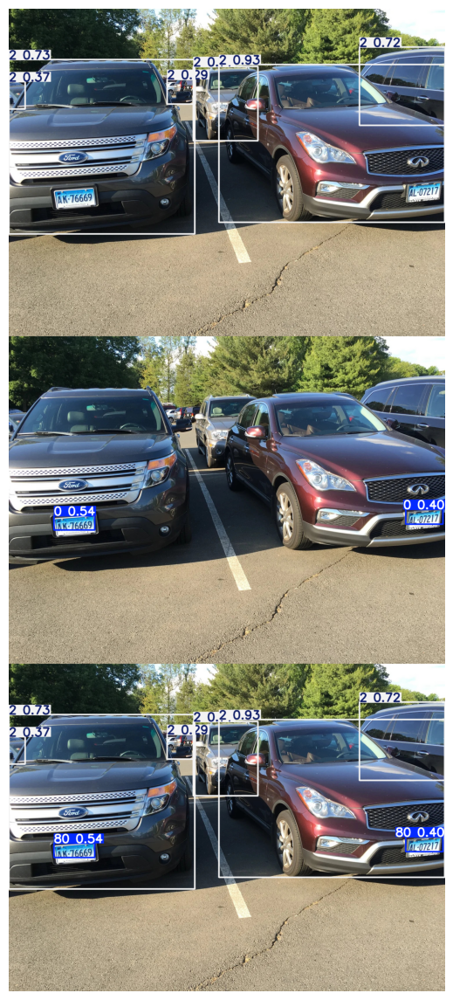

In [ ]:
show_output([result_coco.plot(), result_lp.plot(), result_merged.plot()])

In [ ]:
# Save .pt of merged model
model_2.ckpt = {"model": model_2.model}
model_2.save("merged.pt")

# Load saved merged model. No additional steps required.
model_2 = YOLO("merged.pt")

> **NOTE**
>
> To run `merged.pt` on your own system, you need to install patched Ultralytics the same way as shown in the [beginning](#scrollTo=byoGcpV5j-Eo) of the notebook. Alternatively, you can export the model to a different format like ONNX which can then be loaded with official Ultralytics without patching.

In [ ]:
# Export to ONNX
model_2.export(format="onnx")